In [ ]:
pip install torchmetrics pandas albumentations wandb matplotlib segmentation-models-pytorch scikit-learn nbformat

In [1]:
import torch

if torch.cuda.is_available():
    device_name = "cuda"
elif torch.backends.mps.is_available():
    device_name = "mps"
else:
    device_name = "cpu"
device_name

'cuda'

In [2]:
import torch.nn as nn 
import segmentation_models_pytorch as smp
import wandb

BATCH_SIZE = 32
LR = 0.001
CLASSES = 8
IMG_SIZE = (256,256)
MASK_SIZE = (256,256)
TRAIN_VAL_TEST_SPLIT = [0.9, 0.05, 0.05]
EPOCHS = 50
LOSS_FUNCTION = smp.losses.JaccardLoss("multiclass", [1,2,3,4,5,6,7])

AUGMENT = True
SAVE_BEST_MODEL = True
IS_MULTICLASS = True if CLASSES > 2 else False
NUM_OF_WORKERS = 12




In [3]:

wandb.init(project="zneus-tiger-u-net", name="Base model")
# Config hyperparameters

config = wandb.config
config.batch_size = BATCH_SIZE
config.learning_rate = LR
config.epochs = EPOCHS
config.loss_function = "JaccardLoss(\"multiclass\", [0,1,2])"
config.image_size = IMG_SIZE


wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: amal-akhmadinurov (amal-akhmadinurov-stu) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [4]:
import torch
from torch import nn

from torchvision.transforms import Resize

class UNetEncoderBlock(nn.Module):
    def __init__(self,in_channels, out_channels, custom_conv=None, *args, **kwargs):
        super().__init__(*args, **kwargs)
        if custom_conv != None:
            self.conv = custom_conv
        else:
            self.conv = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels, out_channels,kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            )

    def forward(self, x):
        x = self.conv(x)
        return x
    
class UNetDecoderBlock(nn.Module):
    def __init__(self,in_channels, out_channels,use_upscale=True, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.use_upscale = use_upscale
        self.upscale = nn.Sequential(
            
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True),
            
           
        )
       
        if self.use_upscale:
            
            self.conv = nn.Sequential(
             
                nn.Conv2d(in_channels*2, out_channels, kernel_size=3, stride=1, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
              
            )
        else:
            self.conv = nn.Sequential(
             
                nn.Conv2d(in_channels*2, out_channels, kernel_size=3, stride=1, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
              
            )

    def forward(self, x,skip):
        if self.use_upscale:
            x = self.upscale(x)
        
        resize = Resize((x.size()[2], x.size()[3]))
        skip = resize(skip)
      
        x = torch.cat([x,skip], dim=1)
        x = self.conv(x)
        return x
        
    


In [5]:
import torch

class EarlyStopping:
    def __init__(self, patience=5, min_delta=0.0):
        """
        Args:
            patience (int): How many epochs to wait after last improvement.
            min_delta (float): Minimum change to qualify as an improvement.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0


In [ ]:
import torch


import torch
from torch import nn
from torchmetrics.segmentation import MeanIoU, DiceScore
from torchmetrics.classification import Accuracy
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torchvision.models as models
#from device import device_name
#from blocks import *
import wandb

class UNet(nn.Module):
    def __init__(self, lr=0.001, loss=nn.CrossEntropyLoss(), num_classes=2, use_pretrained_weights=True,reduce_lr_patience=10, early_stopping_patience=10, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.num_classes = num_classes
        self.iou = MeanIoU(num_classes, include_background=True, input_format="index")
        self.accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.dice = DiceScore(num_classes, include_background=True, average="macro",input_format="index")
        self.loss_fn = loss


        self.enc1 = UNetEncoderBlock(3,64)
        self.enc2 = UNetEncoderBlock(64,128)
        self.enc3 = UNetEncoderBlock(128,256)
        self.enc4 = UNetEncoderBlock(256,512)

        
       

        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

       
        self.dec1 = UNetDecoderBlock(512,256)
        self.dec2 = UNetDecoderBlock(256,128)
        self.dec3 = UNetDecoderBlock(128,64)
        self.dec4 = UNetDecoderBlock(64,32)
     

        self.output_layer = nn.Conv2d(32, num_classes, kernel_size=1)
        

        self.optimizer = torch.optim.Adam(self.parameters(), lr=lr)
        self.scheduler = ReduceLROnPlateau(
            self.optimizer, mode='min', factor=0.5, patience=5
        )
        self.early_stopping = EarlyStopping(patience=early_stopping_patience, min_delta=0.01)
        self.to(device_name)
        

    def forward(self, x):
        x1 = self.enc1(x) 
    
        x2 = self.enc2(x1)
    
        x3 = self.enc3(x2)
     
        x4 = self.enc4(x3)

     

        bottleneck = self.bottleneck(x4)
        
        d1 = self.dec1(bottleneck, x4)
        
        d2 = self.dec2(d1, x3)
        
        d3 = self.dec3(d2, x2)
        
        d4 = self.dec4(d3, x1)

        return self.output_layer(d4)
        
        
    def evaluate(self, dataloader):
        self.eval()
        eval_loss = 0
        self.iou.reset()
        self.dice.reset()
        self.accuracy.reset()

        with torch.no_grad():
            for batch in dataloader:

                x = batch[0].to(device_name)
                y = batch[1].to(device_name)

                output = self.forward(x)

                if self.num_classes > 2:
                    preds = torch.argmax(output, dim=1)
                else:
                    preds = (torch.sigmoid(output)>0.5)
                    
                loss = self.loss_fn(output.squeeze(1), y.squeeze(1))
              
                self.iou(preds.long().squeeze(1), y.long().squeeze(1))
                self.dice(preds.long().squeeze(1), y.long().squeeze(1))
                self.accuracy(preds.long().squeeze(1), y.long().squeeze(1))
          
                eval_loss += loss.item()

        self.train()
        return (eval_loss/len(dataloader), self.iou.compute(), self.dice.compute(), self.accuracy.compute())
    
        
    def fit(self, train_dataloader, val_dataloader, epochs=10):
        
        best_val_loss = 9999
        for i in range(0,epochs):
            self.iou.reset()
            self.dice.reset()
            self.accuracy.reset()
            epoch_loss = 0
            for batch in train_dataloader:

                x = batch[0].to(device_name)
                y = batch[1].to(device_name)

                output = self.forward(x)
             


                if self.num_classes > 2:
                    preds = torch.argmax(output, dim=1)
                else:
                    preds = (torch.sigmoid(output)>0.5)

                loss = self.loss_fn(output.squeeze(1), y.squeeze(1))

                self.iou(preds.long().squeeze(1), y.long().squeeze(1))
                self.dice(preds.long().squeeze(1), y.long().squeeze(1))
                self.accuracy(preds.long().squeeze(1), y.long().squeeze(1))

                epoch_loss += loss.item()

                self.zero_grad()
                loss.backward()
                self.optimizer.step()


            epoch_loss/=len(train_dataloader)
            epoch_iou = self.iou.compute()
            epoch_dice = self.dice.compute()
            epoch_acc = self.accuracy.compute()

            val_loss, val_iou, val_dice, val_acc = self.evaluate(val_dataloader)

            if best_val_loss > val_loss:
                best_val_loss = val_loss
                torch.save(self.state_dict(), "best-model-by-loss.pth")

            
            
            
            wandb.log({"epoch": i, "Train Loss": epoch_loss, "Train Dice":epoch_dice, "Train IOU":epoch_iou, "Val Loss":val_loss,"Val Dice":val_dice, "Val IOU":val_iou})
            self.scheduler.step(val_loss)
            self.early_stopping(val_loss)
            if self.early_stopping.early_stop:
                print("Early stopping")
                break
            print(f"Epoch {i+1} Loss:{epoch_loss:.4f} Dice:{epoch_dice:.4f} IOU:{epoch_iou:.4f} Val Loss:{val_loss:.4f} Val Dice:{val_dice:.4f} Val IOU:{val_iou:.4f} LR = {self.optimizer.param_groups[0]['lr']}")
        wandb.finish()
     

In [7]:
import torch
from torchvision.io import decode_image, ImageReadMode
from torchvision.transforms import InterpolationMode, Resize, ColorJitter, Normalize, GaussianBlur
import torchvision.transforms.v2.functional as F
import os
import random
import numpy as np
import cv2
import albumentations as A

class SegmentationDataset(torch.utils.data.Dataset):
    def __init__(self, dataset_path, image_size=(256,256), mask_size=(256,256),
                 is_multiclass=True, augment=False, cache=False, border_mode=cv2.BORDER_REFLECT):
        super().__init__()
        self.image_size = image_size
        self.mask_size = mask_size
        self.is_multiclass = is_multiclass

        self.image_paths = sorted(
            [f for f in os.listdir(os.path.join(dataset_path, "images")) if not f.startswith(".")]
        )
        self.image_paths = [os.path.join(dataset_path, "images", f) for f in self.image_paths]
        
        self.mask_paths = sorted(
            [f for f in os.listdir(os.path.join(dataset_path, "masks")) if not f.startswith(".")]
        )
        self.mask_paths = [os.path.join(dataset_path, "masks", f) for f in self.mask_paths]

        self.resize_image = Resize(image_size, interpolation=InterpolationMode.BILINEAR)
        self.resize_mask  = Resize(mask_size, interpolation=InterpolationMode.NEAREST)
        
        self.augment = augment
        self.cache = cache
        self.cache_images = {} if cache else None
        self.cache_masks  = {} if cache else None

        self.normalize = Normalize(mean=[0.485, 0.456, 0.406],
                                   std=[0.229, 0.224, 0.225])
        
        self.transform = A.Compose([
            
                A.Rotate(limit=45, border_mode=border_mode, p=0.5),  # Reflect avoids constant fill
                A.ShiftScaleRotate(shift_limit=0.5, scale_limit=0.15, rotate_limit=0, border_mode=border_mode, p=0.5),  # Wrap mode
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5)
            ], additional_targets={'mask': 'mask'}) 
        self.transform.is_check_shapes=False
    def __getitem__(self, index):
        image = None
        mask = None
        if self.cache and index in self.cache_images:
            image = self.cache_images[index]
            mask = self.cache_masks[index]
        else:
            # Read image using OpenCV (BGR format) and convert to RGB
            image = cv2.imread(self.image_paths[index], cv2.IMREAD_COLOR)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
            
            # Read mask using OpenCV (grayscale)
            mask = cv2.imread(self.mask_paths[index], cv2.IMREAD_GRAYSCALE).astype(np.float32)

            image = cv2.resize(image, self.image_size, interpolation=cv2.INTER_LINEAR)
            mask = cv2.resize(mask,  self.mask_size, interpolation=cv2.INTER_NEAREST)
            
            if self.is_multiclass:
                mask = mask.astype(np.int64)
            else:
                mask /= 255.0
 
            if self.cache:
                self.cache_images[index] = image
                self.cache_masks[index] = mask

        if self.augment:
            
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']
      
        image = torch.from_numpy(image).permute(2,0,1)    
        image = self.normalize(image)
        
        return image, torch.from_numpy(mask).unsqueeze(0).long()

    def __len__(self):
        return len(self.image_paths)


In [8]:
import torch

from torch.utils.data import DataLoader


DATASET_PATH = "tiger-patches/patches/"

dataset = SegmentationDataset(DATASET_PATH,image_size=IMG_SIZE, mask_size=IMG_SIZE, augment=True, is_multiclass=IS_MULTICLASS, cache=True)

print(f"Amount of images:{len(dataset)}")

full_dataset = SegmentationDataset(
    DATASET_PATH,
    image_size=IMG_SIZE,
    mask_size=MASK_SIZE,
    augment=False,          # default for val/test
    is_multiclass=IS_MULTICLASS,
    cache=True
)

my_generator = torch.Generator().manual_seed(42)

# Split indices
train_size = int(TRAIN_VAL_TEST_SPLIT[0] * len(full_dataset))
val_size = int(TRAIN_VAL_TEST_SPLIT[1] * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

train_indices, val_indices, test_indices = torch.utils.data.random_split(
    range(len(full_dataset)), [0.9, 0.05, 0.05], generator=my_generator
)
train_dataset = SegmentationDataset(
    DATASET_PATH,
    image_size=IMG_SIZE,
    mask_size=MASK_SIZE,
    augment=True,   # only train has augmentations
    is_multiclass=IS_MULTICLASS,
    cache=True,
)

val_dataset = SegmentationDataset(
    DATASET_PATH,
    image_size=IMG_SIZE,
    mask_size=MASK_SIZE,
    augment=False,
    is_multiclass=IS_MULTICLASS,
    cache=True,
)

test_dataset = SegmentationDataset(
    DATASET_PATH,
    image_size=IMG_SIZE,
    mask_size=MASK_SIZE,
    augment=False,
    is_multiclass=IS_MULTICLASS,
    cache=True,
)

# Apply the split indices
train_dataset = torch.utils.data.Subset(train_dataset, train_indices.indices)
val_dataset   = torch.utils.data.Subset(val_dataset, val_indices.indices)
test_dataset  = torch.utils.data.Subset(test_dataset, test_indices.indices)


train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_OF_WORKERS)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE,shuffle=True,num_workers=NUM_OF_WORKERS)

print(len(train_dataset))
print(len(val_dataset))
print(len(test_dataset))


model = UNet(num_classes=CLASSES, loss=LOSS_FUNCTION, lr=LR)




/venv/main/lib/python3.12/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Amount of images:3986
3588
199
199


In [9]:
model.fit(train_dataloader, val_dataloader, epochs=EPOCHS)
torch.save(model.state_dict(),"model.pth")

Epoch 1 Loss:0.7534 Dice:0.1845 IOU:0.1111 Val Loss:0.7977 Val Dice:0.2351 Val IOU:0.1369 LR = 0.001
Epoch 2 Loss:0.7019 Dice:0.3027 IOU:0.2072 Val Loss:0.7107 Val Dice:0.2820 Val IOU:0.1893 LR = 0.001
Epoch 3 Loss:0.6745 Dice:0.3178 IOU:0.2169 Val Loss:0.7566 Val Dice:0.2318 Val IOU:0.1590 LR = 0.001
Epoch 4 Loss:0.6782 Dice:0.2738 IOU:0.1853 Val Loss:0.7421 Val Dice:0.2084 Val IOU:0.1530 LR = 0.001
Epoch 5 Loss:0.6602 Dice:0.2455 IOU:0.1612 Val Loss:0.7178 Val Dice:0.1992 Val IOU:0.1200 LR = 0.001
Epoch 6 Loss:0.6420 Dice:0.2458 IOU:0.1601 Val Loss:0.6844 Val Dice:0.2214 Val IOU:0.1479 LR = 0.001
Epoch 7 Loss:0.6483 Dice:0.2434 IOU:0.1606 Val Loss:0.6130 Val Dice:0.2368 Val IOU:0.1648 LR = 0.001
Epoch 8 Loss:0.6440 Dice:0.2514 IOU:0.1684 Val Loss:0.6375 Val Dice:0.2507 Val IOU:0.1784 LR = 0.001
Epoch 9 Loss:0.6205 Dice:0.2598 IOU:0.1748 Val Loss:0.5886 Val Dice:0.2660 Val IOU:0.1803 LR = 0.001
Epoch 10 Loss:0.6223 Dice:0.2622 IOU:0.1763 Val Loss:0.6483 Val Dice:0.2816 Val IOU:0.1694 

Train Dice,▁▇█▆▄▄▄▅▅▅▅▅▆▆▆▆▇▇█
Train IOU,▁▇█▆▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇
Train Loss,█▆▅▅▄▃▄▃▂▃▂▂▂▂▂▂▂▂▁
Val Dice,▃▅▃▁▁▂▃▃▄▅▄▅▆▆▇▄▆▇█
Val IOU,▂▆▄▄▁▃▄▆▆▅▆▆▇▅▇▆▆▇█
Val Loss,█▅▇▆▅▄▂▃▁▃▁▃▁▃▁▃▂▁▂
epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
Train Dice,0.30923
Train IOU,0.20573
Train Loss,0.58468
Val Dice,0.34644


In [10]:
torch.save(model.state_dict(),"model.pth")

In [32]:
model.load_state_dict(torch.load("best-model-by-loss.pth", map_location=device_name))

<All keys matched successfully>

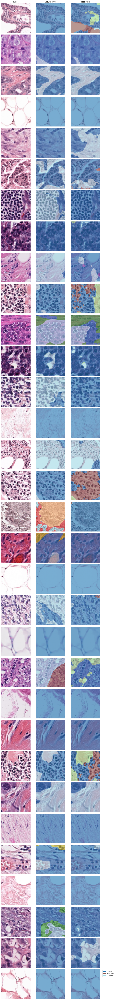

In [33]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import torch

def denormalize(tensor, mean, std):
    mean = torch.tensor(mean, device=tensor.device).view(1, -1, 1, 1)
    std = torch.tensor(std, device=tensor.device).view(1, -1, 1, 1)
    return tensor * std + mean

# Load a normal batch
val_dataloader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_OF_WORKERS
)

images, ground_truth = next(iter(val_dataloader))
images = images.to("cuda")

# Forward pass
with torch.no_grad():
    preds = model(images)

# Handle predictions
if model.num_classes > 2:
    preds = torch.argmax(preds, dim=1)              # (B, H, W)
else:
    preds = (torch.sigmoid(preds) > 0.5).float()    # (B, 1, H, W)
    preds = preds.squeeze(1)

# Format masks
ground_truth = ground_truth.squeeze(1).cpu().numpy()   # (B, H, W)
preds = preds.cpu().numpy()                            # (B, H, W)

# Denormalize and convert to (B, H, W, C)
images_denorm = denormalize(
    images,
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
).cpu().numpy()
images_denorm = np.transpose(images_denorm, (0, 2, 3, 1))

# Plotting
num_samples = len(images_denorm)
classes_names = {0: "rest", 1: "tumor", 2: "stroma"}
cmap = plt.get_cmap("tab20", len(classes_names))

fig, axes = plt.subplots(num_samples, 3, figsize=(12, 3 * num_samples))
if num_samples == 1:
    axes = axes.reshape(1, 3)

column_titles = ["Image", "Ground Truth", "Prediction"]
for col, title in enumerate(column_titles):
    axes[0, col].set_title(title, fontsize=12)

for i in range(num_samples):
    axes[i, 0].imshow(images_denorm[i])
    axes[i, 1].imshow(images_denorm[i])
    axes[i, 1].imshow(ground_truth[i], cmap="tab20", alpha=0.6)
    axes[i, 2].imshow(images_denorm[i])
    axes[i, 2].imshow(preds[i], cmap="tab20", alpha=0.6)

    for col in range(3):
        axes[i, col].axis("off")

# Legend
patches = [
    mpatches.Patch(color=cmap(i), label=f"{i} - {name}")
    for i, name in classes_names.items()
]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc="upper left")

plt.tight_layout()
plt.show()


Confusion Matrix:
[[     0  11241  19321]
 [     0 806430 153223]
 [     0 152486 654107]]


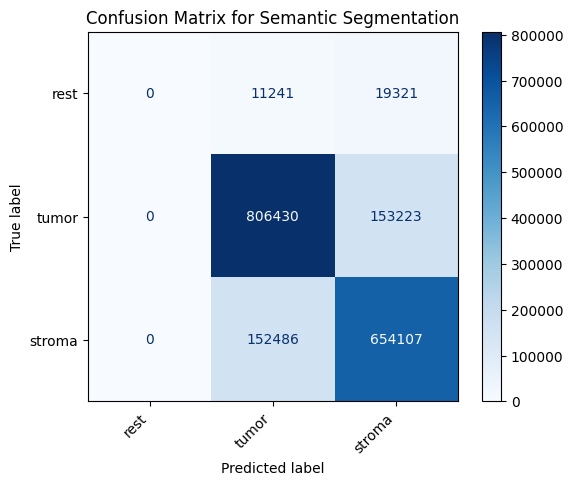

In [34]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
# Example data (each pixel has an integer class label)
val_dataloader = DataLoader(val_dataset, batch_size=199,shuffle=True,num_workers=NUM_OF_WORKERS)
images, ground_truth = next(iter(val_dataloader))

images = images.to("cuda")
result_masks = model(images)

if model.num_classes > 2:
    result_masks = torch.argmax(result_masks,dim=1)
    
else:
    result_masks = (torch.sigmoid(result_masks)>0.5).float()
classes_names = {0:"rest", 1:"tumor", 2:"stroma"}
y_true = ground_truth.reshape(ground_truth.shape[0],IMG_SIZE[0],IMG_SIZE[1],1).numpy()
y_pred = result_masks.detach().cpu().numpy().reshape(ground_truth.shape[0],IMG_SIZE[0],IMG_SIZE[1],1)

# Flatten both arrays (so each pixel = one prediction)
y_true_flat = y_true.flatten()
y_pred_flat = y_pred.flatten()

# Compute confusion matrix
cm = confusion_matrix(y_true_flat, y_pred_flat, labels=[0, 1, 2])

print("Confusion Matrix:")
print(cm)

# Optional: visualize
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes_names.values())
disp.plot(cmap="Blues", values_format="d")
plt.xticks(rotation=45, ha='right') 
# Show the plot
plt.title("Confusion Matrix for Semantic Segmentation")
plt.show()
